In [ ]:
%load_ext autoreload
%autoreload 2
import sys
from os.path import join as oj

import matplotlib.image as mpimg
from matching import *

import config
import data
import util
sys.path.append(config.LIB_PATH)

# df contains filenames, ids, and attributes
df = data.load_all_labs()
df = df.set_index('fname_id')
# df = df[['id', 'fname_final', 'age', 'gender', 'race_pred', 'race4_pred', 'Eyeglasses']] # only keep few keys to speed things up

loading labels...


 11%|█▏        | 3384/30000 [00:01<00:12, 2139.55it/s]

# look at how these feats vary

yaw is facing left/right pitch is facing up/down roll is tilting left/right


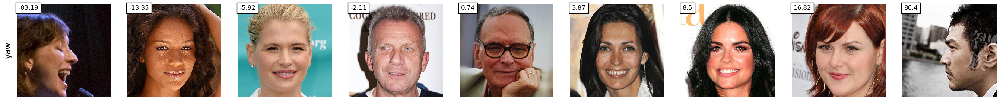

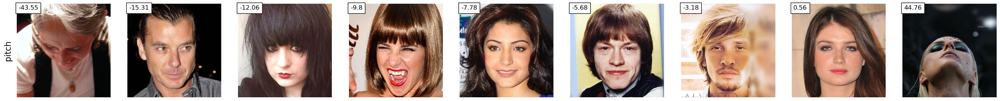

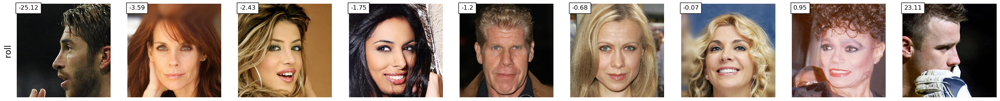

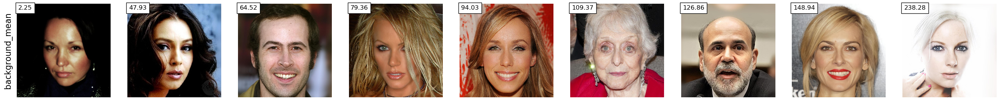

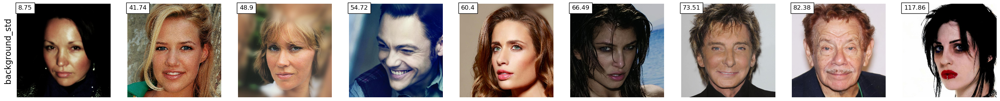

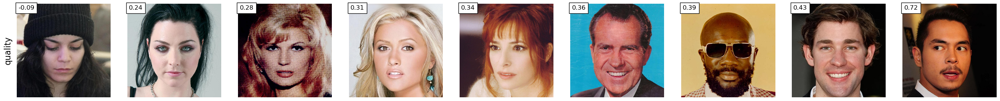

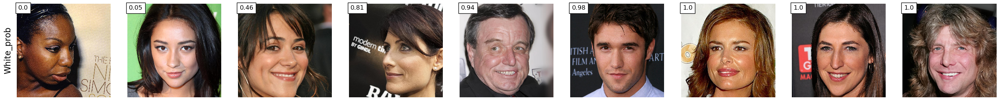

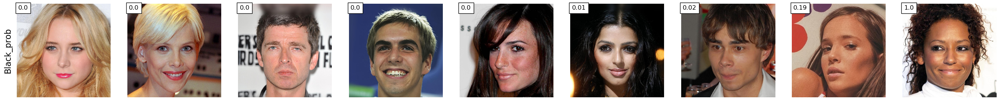

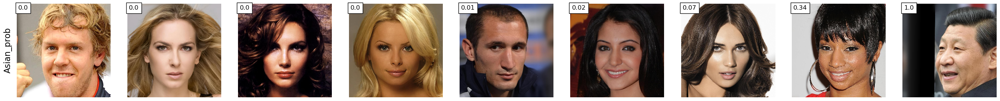

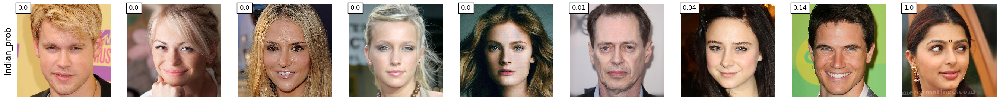

In [4]:
C = 8
print('yaw is facing left/right', 'pitch is facing up/down', 'roll is tilting left/right')
for k in ['yaw', 'pitch', 'roll'] + ['background_mean', 'background_std', 'quality'] + [k for k in df.keys() if 'prob' in k]:
    idxs = [int(i / C * df.shape[0]) for i in range(C)] + [df.shape[0] - 1]
    d = df.sort_values(k).iloc[idxs]
    ims = [mpimg.imread(oj(DIR_IMS, f)) for f in d.fname_final]
    vals = d[k].round(2)
    util.plot_row(ims, annot_list=vals, ylab=k)